In [2]:
import torch
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from os.path import exists

import seaborn as sns

In [4]:
def read_result(read, method, folder_path, I, grad, nc=300):
    
    tls, tas, vls, vas, test_accs =  [], [], [], [], []
    
    for ith in read:
        tls.append(np.load(folder_path + method + grad + "I" + str(I) + "/tl_" + str(ith)+".npy"))
        tas.append(np.load(folder_path + method + grad + "I" + str(I) + "/ta_" + str(ith)+".npy"))
        vls.append(np.load(folder_path + method + grad + "I" + str(I) + "/vl_" + str(ith)+".npy"))
        vas.append(np.load(folder_path + method + grad + "I" + str(I) + "/va_" + str(ith)+".npy"))
        test_accs.append(torch.load(folder_path + method + grad + "I" + str(I) + "/model_" + str(ith), 
                                    map_location=torch.device('cpu'))["test_acc"])
    ts = I*len(tls[0])
    steps = np.arange(I, ts+I, I)
    
    try:
        return np.array(tls), np.array(tas), np.array(vls), np.array(vas), np.array(test_accs), steps
    except:
        test_accs = [test_acc.cpu() for test_acc in test_accs]
        return np.array(tls), np.array(tas), np.array(vls), np.array(vas), np.array(test_accs), steps

In [15]:
folders = ["experiments/DNC/0.78phi/result/", 
           "experiments/cora/result/", 
           "experiments/SNC/0.78phi/result/",
           "experiments/SC/result/"]

method = "GFLAPPNP/"

mdnc = ["10 biased_grad/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/", 
        "10 hg_noise_0.1_0.1/", "10 g_noise_1/"]

mcora = ["10 biased_grad/", "10 g_noise_1/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/"]

msnc = ["10 biased_grad/", "10 g_noise_1/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/", 
        "10 hg_noise_0.1_0.1/"]

mgc = ["10 biased_grad/", "10 g_noise_1/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/", 
       "10 hg_noise_0.1_0.1/"]


ms = [mdnc, mcora, msnc, mgc]
exps = np.arange(20)
exp_names = ["synthetic_DNC", "subCora_DNC", "synthetic_SNC", "synthetic_SC"]

testacc_means = []
vnames = []
enames = []
testacc_stds = []

for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
            
        grad_name = grad
            
        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testacc_means.append(np.mean(test_accs))
        testacc_stds.append(1.96*np.std(test_accs)/np.sqrt(20))
        vnames.append("GFL-APPNP/"+grad_name+"I="+str(I))
        enames.append(exp_names[i])

        
df = pd.DataFrame(zip(enames, vnames, testacc_means, testacc_stds))
df

,0,1,2,3
0,synthetic_DNC,GFL-APPNP/biased_grad/I=10,0.933750,0.009853
1,synthetic_DNC,GFL-APPNP/hg_noise_1_1/I=10,0.940938,0.007961
2,synthetic_DNC,GFL-APPNP/h_noise_1/I=10,0.943750,0.007401
3,synthetic_DNC,GFL-APPNP/h_noise_0.1/I=10,0.943437,0.007722
4,synthetic_DNC,GFL-APPNP/hg_noise_0.1_0.1/I=10,0.942812,0.007614
5,synthetic_DNC,GFL-APPNP/g_noise_1/I=10,0.941875,0.007304
6,subCora_DNC,GFL-APPNP/biased_grad/I=10,0.540672,0.037175
7,subCora_DNC,GFL-APPNP/g_noise_1/I=10,0.539568,0.041153
8,subCora_DNC,GFL-APPNP/hg_noise_1_1/I=10,0.511268,0.037497
9,subCora_DNC,GFL-APPNP/h_noise_1/I=10,0.537956,0.041524


In [34]:
plt.rcParams['xtick.labelsize'] = 30

plt.rcParams['ytick.labelsize'] = 30

fig, ax = plt.subplots(2, 4, figsize=(32, 12), dpi=800)


folders = ["experiments/DNC/0.78phi/result/", 
           "experiments/cora/result/", 
           "experiments/SNC/0.78phi/result/",
           "experiments/SC/result/"]

method = "GFLAPPNP/"

mdnc =  ["10 biased_grad/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/", "10 hg_noise_0.1_0.1/"]

mcora = ["10 biased_grad/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/", "10 hg_noise_0.1_0.1/"]

msnc =  ["10 biased_grad/", "10 hg_noise_1_1/", "10 h_noise_1/", "10 h_noise_0.1/", "10 hg_noise_0.1_0.1/"]

mgc =   ["10 biased_grad/", "10 h_noise_0.1/", "10 hg_noise_0.1_0.1/"]


ms = [mdnc, mcora, msnc, mgc]
exps = np.arange(20)
exp_names = ["synthetic_DNC", "subCora_DNC", "synthetic_SNC", "synthetic_SC"]

color_map = {"10 hg_noise_1_1/": "red",
             "10 biased_grad/": "blue",
             "10 h_noise_1/": "purple",
             "10 hg_noise_0.1_0.1/": "green",
             "10 g_noise_1/":"yellow",
             "10 h_noise_0.1/" : "pink"}

testacc_means = []
names = []
testacc_stds = []

for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
        grad_name = grad

        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testacc_means.append(np.mean(test_accs))
        testacc_stds.append(np.std(test_accs))
        names.append(exp_names[i]+grad_name+str(I))
        tls_mean, tls_std = np.mean(tls,axis=0), np.std(tls,axis=0)
        vls_mean, vls_std = np.mean(vls,axis=0), np.std(vls,axis=0)

        c = color_map[m]
        
        ax[0, i].scatter(steps, tls_mean, 
                         label="GFL-APPNP"+" I="+str(I)+" "+grad_name, s=5, color=c)
        ax[0, i].fill_between(steps, tls_mean-1.96*tls_std/np.sqrt(20), tls_mean+1.96*tls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        ax[1, i].scatter(steps, vls_mean,
                         label="GFL-APPNP"+" I="+str(I)+" "+grad_name, s=5, color=c)
        ax[1, i].fill_between(steps, vls_mean-1.96*vls_std/np.sqrt(20), vls_mean+1.96*vls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        
ax[0,0].set_title("Synthetic DNC", fontsize=30)
ax[0,1].set_title("SubCora DNC", fontsize=30)
ax[0,2].set_title("Synthetic SNC", fontsize=30)
ax[0,3].set_title("Synthetic SC", fontsize=30)


ax[1,0].set_xlabel("Updates", fontsize=30)
ax[1,1].set_xlabel("Updates", fontsize=30)
ax[1,2].set_xlabel("Updates", fontsize=30)
ax[1,3].set_xlabel("Updates", fontsize=30)


ax[0,0].set_ylabel("Train Loss", fontsize=30)
ax[1,0].set_ylabel("Validation Loss", fontsize=30)


ax[1,0].legend(loc='upper center', bbox_to_anchor=(2.3, -0.35), ncol=4, fontsize=30, markerscale=5)



ax[0,0].grid()
ax[0,1].grid()
ax[0,3].grid()
ax[0,2].grid()
ax[1,0].grid()
ax[1,1].grid()
ax[1,3].grid()
ax[1,2].grid()

plt.subplots_adjust(left  = 0.05,  # the left side of the subplots of the figure
                    right = 0.8,   # the right side of the subplots of the figure
                    bottom = 0.3,   # the bottom of the subplots of the figure
                    top = 0.9,     # the top of the subplots of the figure
                    wspace = 0.3,   # the amount of width reserved for blank space between subplots
                    hspace = 0.22,   # the amount of height reserved for white space between subplots
                   )
#plt.savefig("grid_main_result.jpeg")

In [20]:
plt.rcParams['xtick.labelsize'] = 30

plt.rcParams['ytick.labelsize'] = 30

fig, ax = plt.subplots(2, 4, figsize=(32, 12), dpi=800)


folders = ["DNC/0.78phi/result/", 
           "cora/result/", 
           "SNC/0.78phi/result/",
           "GC/"]

method = "GFLAPPNP/"

mdnc = ["50 biased_grad/", "20 biased_grad/", "10 biased_grad/", "1 biased_grad/"]

mcora = ["50 biased_grad/", "20 biased_grad/", "10 biased_grad/", "1 biased_grad/"]

msnc = ["50 biased_grad/", "20 biased_grad/", "10 biased_grad/", "1 biased_grad/"]

mgc = ["50 biased_grad/", "20 biased_grad/", "10 biased_grad/", "1 biased_grad/"]

ms = [mdnc, mcora, msnc, mgc]

exps = np.arange(20)

exp_names = ["synthetic_DNC", "subCora_DNC", "synthetic_SNC", "synthetic_GC"]

color_map = {"50 biased_grad/": "red",
             "10 biased_grad/": "blue",
             "20 biased_grad/": "purple",
             "1 biased_grad/": "green"}

testacc_means = []
names = []
testacc_stds = []

for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
        if grad == "no_grad/":
            grad_name = "No Compensation"
        elif grad == "biased_grad/":
            grad_name = "Gradient Compensation"
        elif grad == "noisy_grad/":
            grad_name = "Noisy Gradient Compensation"
        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testacc_means.append(np.mean(test_accs))
        testacc_stds.append(np.std(test_accs))
        names.append(exp_names[i]+grad_name+str(I))
        tls_mean, tls_std = np.mean(tls,axis=0), np.std(tls,axis=0)
        vls_mean, vls_std = np.mean(vls,axis=0), np.std(vls,axis=0)

        c = color_map[m]
        
        ax[0, i].scatter(steps, tls_mean, 
                         label="GFL-APPNP"+" I="+str(I) + grad_name, s=5, color=c)
        ax[0, i].fill_between(steps, tls_mean-1.96*tls_std/np.sqrt(20), tls_mean+1.96*tls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        ax[1, i].scatter(steps, vls_mean,
                         label="GFL-APPNP"+" I="+str(I), s=5, color=c)
        ax[1, i].fill_between(steps, vls_mean-1.96*vls_std/np.sqrt(20), vls_mean+1.96*vls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        
ax[0,0].set_title("Synthetic DNC", fontsize=30)
ax[0,1].set_title("SubCora DNC", fontsize=30)
ax[0,2].set_title("Synthetic SNC", fontsize=30)
ax[0,3].set_title("Synthetic SC", fontsize=30)


ax[1,0].set_xlabel("Updates", fontsize=30)
ax[1,1].set_xlabel("Updates", fontsize=30)
ax[1,2].set_xlabel("Updates", fontsize=30)
ax[1,3].set_xlabel("Updates", fontsize=30)


ax[0,0].set_ylabel("Train Loss", fontsize=30)
ax[1,0].set_ylabel("Validation Loss", fontsize=30)


ax[1,0].legend(loc='upper center', bbox_to_anchor=(2.3, -0.35), ncol=4, fontsize=30, markerscale=5)



ax[0,0].grid()
ax[0,1].grid()
ax[0,3].grid()
ax[0,2].grid()
ax[1,0].grid()
ax[1,1].grid()
ax[1,3].grid()
ax[1,2].grid()

plt.subplots_adjust(left  = 0.05,  # the left side of the subplots of the figure
                    right = 0.8,   # the right side of the subplots of the figure
                    bottom = 0.3,   # the bottom of the subplots of the figure
                    top = 0.9,     # the top of the subplots of the figure
                    wspace = 0.3,   # the amount of width reserved for blank space between subplots
                    hspace = 0.22,   # the amount of height reserved for white space between subplots
                   )
plt.savefig("grid_main_result.jpeg")

FileNotFoundError: [Errno 2] No such file or directory: 'DNC/0.78phi/result/GFLAPPNP/biased_grad/I50/tl_0.npy'

In [4]:
folders = ["DNC/0.78phi/result/", 
           "cora/result/", 
           "SNC/0.78phi/result/",
           "GC/"]

method = "GFLAPPNP/"
mdnc = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/", 
        "10 noisy_grad/"]



mcora = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/",
        "10 noisy_grad/"]


msnc = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/",
        "10 noisy_grad/"]


mgc = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/",
        "10 noisy_grad/"]


ms = [mdnc, mcora, msnc, mgc]
exps = np.arange(20)
exp_names = ["synthetic_DNC", "subCora_DNC", "synthetic_SNC", "synthetic_GC"]

testacc_means = []
vnames = []
enames = []
testacc_stds = []

for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
        if grad == "no_grad/":
            grad_name = "No Compensation"
        elif grad == "biased_grad/":
            grad_name = "Gradient Compensation"
        elif grad == "noisy_grad/":
            grad_name = "Noisy Gradient Compensation"
            
        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testacc_means.append(np.mean(test_accs))
        testacc_stds.append(1.96*np.std(test_accs)/np.sqrt(20))
        vnames.append("GFL-APPNP/"+grad_name+"/I="+str(I))
        enames.append(exp_names[i])

In [5]:
df = pd.DataFrame(zip(enames, vnames, testacc_means, testacc_stds))
df

,0,1,2,3
0,synthetic_DNC,GFL-APPNP/Gradient Compensation/I=50,0.930312,0.009617
1,synthetic_DNC,GFL-APPNP/Gradient Compensation/I=10,0.933750,0.009853
2,synthetic_DNC,GFL-APPNP/Gradient Compensation/I=20,0.932500,0.009433
3,synthetic_DNC,GFL-APPNP/Gradient Compensation/I=1,0.931875,0.009244
4,synthetic_DNC,GFL-APPNP/No Compensation/I=10,0.823125,0.020917
5,synthetic_DNC,GFL-APPNP/Noisy Gradient Compensation/I=10,0.930938,0.008330
6,subCora_DNC,GFL-APPNP/Gradient Compensation/I=50,0.539555,0.037285
7,subCora_DNC,GFL-APPNP/Gradient Compensation/I=10,0.540672,0.037175
8,subCora_DNC,GFL-APPNP/Gradient Compensation/I=20,0.542690,0.037327
9,subCora_DNC,GFL-APPNP/Gradient Compensation/I=1,0.542445,0.036940


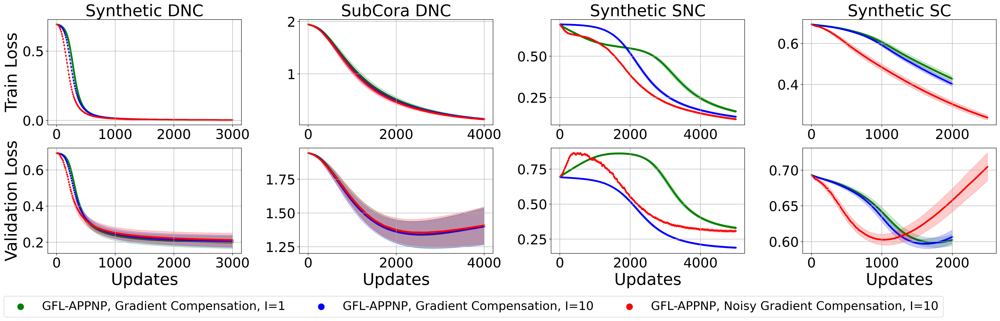

In [13]:
plt.rcParams['xtick.labelsize'] = 25

plt.rcParams['ytick.labelsize'] = 25

fig, ax = plt.subplots(2, 4, figsize=(30, 10), dpi=300)

folders = ["DNC/0.78phi/result/", 
           "cora/result/", 
           "SNC/0.78phi/result/",
           "GC/"]
method = "GFLAPPNP/"



mdnc = ["1 biased_grad/", "10 biased_grad/",
        "10 noisy_grad/"]



mcora = ["1 biased_grad/", "10 biased_grad/",
         "10 noisy_grad/"]


msnc = ["1 biased_grad/", "10 biased_grad/",
        "10 noisy_grad/"]


mgc = ["1 biased_grad/", "10 biased_grad/",
       "10 noisy_grad/"]



ms = [mdnc, mcora, msnc, mgc]
exps = np.arange(20)
exp_names = ["synthetic_DNC", "subCora_DNC", "synthetic_SNC", "synthetic_GC"]
color_map = {"10 noisy_grad/": "red",
             "10 biased_grad/": "blue",
             "1 biased_grad/": "green"}

testacc_means = []
names = []
testacc_stds = []

for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
        if grad == "no_grad/":
            grad_name = "No Compensation"
        elif grad == "biased_grad/":
            grad_name = "Gradient Compensation"
        elif grad == "noisy_grad/":
            grad_name = "Noisy Gradient Compensation"
        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testacc_means.append(np.mean(test_accs))
        testacc_stds.append(np.std(test_accs))
        names.append(exp_names[i]+grad_name+str(I))
        tls_mean, tls_std = np.mean(tls,axis=0), np.std(tls,axis=0)
        vls_mean, vls_std = np.mean(vls,axis=0), np.std(vls,axis=0)
        
        if grad_name != "Gradient Compensation" and folders[i] == "experiments/GC/":
            steps, tls_mean, tls_std = steps[:int(2000/I)], tls_mean[:int(2000/I)], tls_std[:int(2000/I)]
            vls_mean, vls_std = vls_mean[:int(2000/I)], vls_std[:int(2000/I)]

        c = color_map[m]
        ax[0, i].scatter(steps, tls_mean, 
                         label="GFL-APPNP, "+ grad_name + ", I="+str(I), s=5, color=c)
        ax[0, i].fill_between(steps, tls_mean-1.96*tls_std/np.sqrt(20), tls_mean+1.96*tls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        ax[1, i].scatter(steps, vls_mean,
                         label="GFL-APPNP, "+ grad_name + ", I="+str(I), s=5, color=c)
        ax[1, i].fill_between(steps, vls_mean-1.96*vls_std/np.sqrt(20), vls_mean+1.96*vls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        
ax[0,0].set_title("Synthetic DNC", fontsize=30)
ax[0,1].set_title("SubCora DNC", fontsize=30)
ax[0,2].set_title("Synthetic SNC", fontsize=30)
ax[0,3].set_title("Synthetic SC", fontsize=30)


ax[1,0].set_xlabel("Updates", fontsize=30)
ax[1,1].set_xlabel("Updates", fontsize=30)
ax[1,2].set_xlabel("Updates", fontsize=30)
ax[1,3].set_xlabel("Updates", fontsize=30)


ax[0,0].set_ylabel("Train Loss", fontsize=30)
ax[1,0].set_ylabel("Validation Loss", fontsize=30)


ax[1,0].legend(loc='upper center', bbox_to_anchor=(2.2, -0.35), ncol=4, fontsize=22, markerscale=5)


ax[0,0].grid()
ax[0,1].grid()
ax[0,3].grid()
ax[0,2].grid()
ax[1,0].grid()
ax[1,1].grid()
ax[1,3].grid()
ax[1,2].grid()

plt.subplots_adjust(left  = 0.04,  # the left side of the subplots of the figure
                    right = 0.85,   # the right side of the subplots of the figure
                    bottom = 0.3,   # the bottom of the subplots of the figure
                    top = 0.9,     # the top of the subplots of the figure
                    wspace = 0.3,   # the amount of width reserved for blank space between subplots
                    hspace = 0.22,   # the amount of height reserved for white space between subplots
                   )
plt.savefig("noisygradient_result.jpeg")

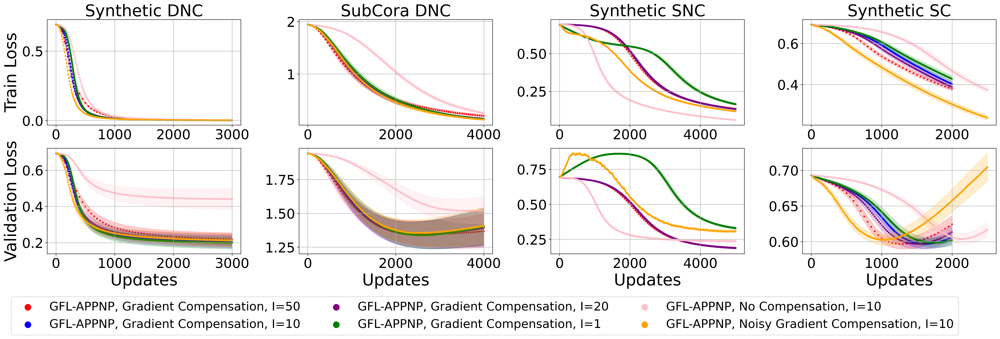

In [14]:
plt.rcParams['xtick.labelsize'] = 25

plt.rcParams['ytick.labelsize'] = 25

fig, ax = plt.subplots(2, 4, figsize=(30, 10), dpi=300)

folders = ["DNC/0.78phi/result/", 
           "cora/result/", 
           "SNC/0.78phi/result/",
           "GC/"]

method = "GFLAPPNP/"

mdnc = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/", 
        "10 noisy_grad/"]



mcora = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/",
        "10 noisy_grad/"]


msnc = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/",
        "10 noisy_grad/"]


mgc = ["50 biased_grad/", "10 biased_grad/", "20 biased_grad/", "1 biased_grad/",
        "10 no_grad/",
        "10 noisy_grad/"]


ms = [mdnc, mcora, msnc, mgc]

exps = np.arange(20)

exp_names = ["synthetic_DNC", "subCora_DNC", "synthetic_SNC", "synthetic_GC"]

color_map = {"50 biased_grad/": "red",
             "10 biased_grad/": "blue",
             "20 biased_grad/": "purple",
             "1 biased_grad/": "green", 
             "10 noisy_grad/": "orange",
             "10 no_grad/": "pink",}

testacc_means = []
names = []
testacc_stds = []

for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
        if grad == "no_grad/":
            grad_name = "No Compensation"
        elif grad == "biased_grad/":
            grad_name = "Gradient Compensation"
        elif grad == "noisy_grad/":
            grad_name = "Noisy Gradient Compensation"
        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testacc_means.append(np.mean(test_accs))
        testacc_stds.append(np.std(test_accs))
        names.append(exp_names[i]+grad_name+str(I))
        tls_mean, tls_std = np.mean(tls,axis=0), np.std(tls,axis=0)
        vls_mean, vls_std = np.mean(vls,axis=0), np.std(vls,axis=0)
        
        if grad_name != "Gradient Compensation" and folders[i] == "experiments/GC/":
            steps, tls_mean, tls_std = steps[:int(2000/I)], tls_mean[:int(2000/I)], tls_std[:int(2000/I)]
            vls_mean, vls_std = vls_mean[:int(2000/I)], vls_std[:int(2000/I)]

        c = color_map[m]
        
        ax[0, i].scatter(steps, tls_mean, 
                         label="GFL-APPNP, "+grad_name+", I="+str(I), s=5, color=c)
        ax[0, i].fill_between(steps, tls_mean-1.96*tls_std/np.sqrt(20), tls_mean+1.96*tls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        ax[1, i].scatter(steps, vls_mean,
                         label="GFL-APPNP, "+grad_name+", I="+str(I), s=5, color=c)
        ax[1, i].fill_between(steps, vls_mean-1.96*vls_std/np.sqrt(20), vls_mean+1.96*vls_std/np.sqrt(20), 
                           alpha=0.2, color=c)
        
        
ax[0,0].set_title("Synthetic DNC", fontsize=30)
ax[0,1].set_title("SubCora DNC", fontsize=30)
ax[0,2].set_title("Synthetic SNC", fontsize=30)
ax[0,3].set_title("Synthetic SC", fontsize=30)


ax[1,0].set_xlabel("Updates", fontsize=30)
ax[1,1].set_xlabel("Updates", fontsize=30)
ax[1,2].set_xlabel("Updates", fontsize=30)
ax[1,3].set_xlabel("Updates", fontsize=30)


ax[0,0].set_ylabel("Train Loss", fontsize=30)
ax[1,0].set_ylabel("Validation Loss", fontsize=30)


ax[1,0].legend(loc='upper center', bbox_to_anchor=(2.26, -0.35), ncol=3, fontsize=22, markerscale=5)


ax[0,0].grid()
ax[0,1].grid()
ax[0,3].grid()
ax[0,2].grid()
ax[1,0].grid()
ax[1,1].grid()
ax[1,3].grid()
ax[1,2].grid()

plt.subplots_adjust(left  = 0.04,  # the left side of the subplots of the figure
                    right = 0.85,   # the right side of the subplots of the figure
                    bottom = 0.3,   # the bottom of the subplots of the figure
                    top = 0.9,     # the top of the subplots of the figure
                    wspace = 0.3,   # the amount of width reserved for blank space between subplots
                    hspace = 0.22,   # the amount of height reserved for white space between subplots
                   )
plt.savefig("all_result.jpeg")

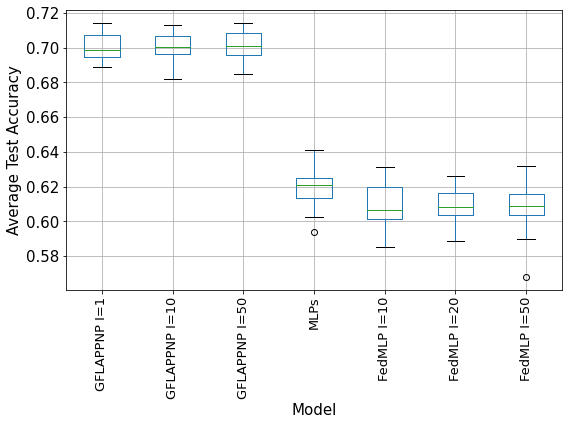

In [11]:
folders = ["GC/"]

method = "GFLAPPNP/"

mgc = ["50 biased_grad/", "10 biased_grad/", "1 biased_grad/"]


ms = [mgc]
exps = np.arange(20)
exp_names = ["synthetic_GC"]

testaccs_GFLAPPNP = {}
testaccs_MLPs = []
testaccs_FedMLP = {}


for i in range(len(folders)):
    
    for m in ms[i]:
        
        I, grad = m.split(" ")
        I = int(I)
        if grad == "no_grad/":
            grad_name = "No Compensation"
        elif grad == "biased_grad/":
            grad_name = "Gradient Compensation"
        elif grad == "noisy_grad/":
            grad_name = "Noisy Gradient Compensation"
            
        tls, tas, vls, vas, test_accs, steps = read_result(exps, method, folders[i], I, grad)
        testaccs_GFLAPPNP[I] = test_accs
        
        
folders = ["GC/"]

method = "GFLAPPNP/"

mgc = ["50 biased_grad/", "10 biased_grad/", "1 biased_grad/"]



for I in [10, 20, 50]:

    test_accs = np.load("GC/FedMLP/testaccs_fedmlp_I"+str(I)+".npy")
    testaccs_FedMLP[I] = test_accs
    
testaccs_MLPs = np.load("GC/MLPs/testaccs_mlps.npy")


df_gn = pd.DataFrame(zip(testaccs_GFLAPPNP[1], testaccs_GFLAPPNP[10], testaccs_GFLAPPNP[50],
                 testaccs_MLPs,
                 testaccs_FedMLP[10], testaccs_FedMLP[20], testaccs_FedMLP[50]),
                 columns=["GFLAPPNP I=1", "GFLAPPNP I=10", "GFLAPPNP I=50",
                          "MLPs",
                          "FedMLP I=10", "FedMLP I=20", "FedMLP I=50"])


plt.figure(figsize=(8,6))
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 15
df_gn.boxplot()
plt.xticks([1, 2, 3, 4, 5, 6, 7], ["GFLAPPNP I=1", "GFLAPPNP I=10", "GFLAPPNP I=50", 
                                "MLPs", 
                                "FedMLP I=10", "FedMLP I=20", "FedMLP I=50"], rotation="vertical", fontsize=13)
plt.ylabel("Average Test Accuracy", fontsize=15)
plt.xlabel("Model", fontsize=15)
plt.tight_layout()
#plt.savefig("experiments/Graph_Necessity.jpeg")

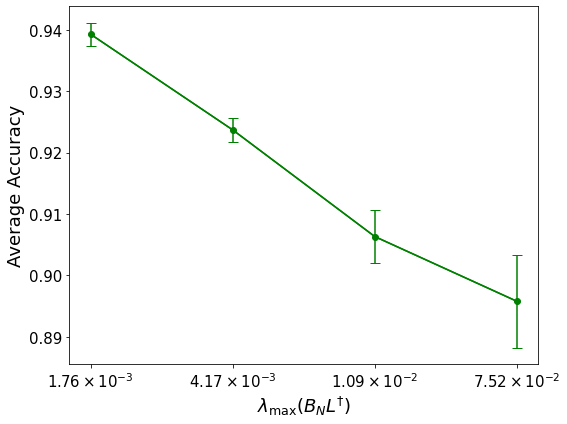

In [12]:
df = pd.read_csv("connectivity_results.csv")
x = [1,2,3,4]
y = df.iloc[:,1]
yerr = 1.96*df.iloc[:,2]/np.sqrt(20)

plt.figure(figsize=(8, 6))
plt.errorbar(x, y, yerr, marker="o", markersize=6, capsize=5, color="green")
plt.plot(x, y, color="green")
plt.xticks([1, 2, 3, 4],[r"$1.76\times 10^{-3}$", r"$4.17\times 10^{-3}$", 
                         r"$1.09\times 10^{-2}$", r"$7.52\times 10^{-2}$"], fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel(r"$\lambda_{\max} (B_N L^{\dagger})$", fontsize=18)
plt.ylabel("Average Accuracy", fontsize=18)
#plt.title("Effect of Graph Structure", fontsize=15)
plt.tight_layout()
#plt.savefig("experiments/connectivity.jpeg")

In [46]:
plt.rcParams['xtick.labelsize'] = 30

plt.rcParams['ytick.labelsize'] = 30

fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(25,10),dpi=800)

x = [1,2,3,4]
y = df.iloc[:,1]
yerr = 1.96*df.iloc[:,2]/np.sqrt(20)

ax[0].errorbar(x, y, yerr, marker="o", markersize=16, capsize=8, elinewidth=2.8, color="green")
ax[0].plot(x, y, color="green")
ax[0].set_xticks([1, 2, 3, 4],[r"$1.76\times 10^{-3}$", r"$4.17\times 10^{-3}$", 
                         r"$1.09\times 10^{-2}$", r"$7.52\times 10^{-2}$"], fontsize=30)

ax[0].set_xlabel(r"$\lambda_{\max} (B_N L^{\dagger})$", fontsize=30, y=-0.2)
ax[0].set_ylabel("Average Accuracy", fontsize=30)
#ax[0].set_title('(a): Effect of Graph Connectivity', fontsize=30)
ax[0].grid()
ax[0].set_title("(a) Effect of Graph Connectivity", y=-0.3, fontsize=30)

my_pal = {"GFLAPPNP I=1": "skyblue", "GFLAPPNP I=10": "skyblue", "GFLAPPNP I=50": "skyblue",
          "MLPs": "lightgreen", 
          "FedMLP I=10":"lightyellow",
          "FedMLP I=20":"lightyellow",
          "FedMLP I=50":"lightyellow",}
sns.boxplot(data=df_gn, ax=ax[1], palette=my_pal)#df_gn.boxplot(ax=ax[1], widths=0.6, boxprops=dict(linewidth=3, color="skyblue"))
ax[1].set_xticks([0, 1, 2, 3, 4, 5, 6], ["GFLAPPNP I=1", "GFLAPPNP I=10", "GFLAPPNP I=50", 
                                "MLPs", 
                                "FedMLP I=10", "FedMLP I=20", "FedMLP I=50"], rotation=35, fontsize=22)
ax[1].grid()
ax[1].set_title("(b) Necessity of Graph", y=-0.3, fontsize=30)
#ax[1].set_ylabel("Average Accuracy", fontsize=30)
#ax[1].set_xlabel("Model", fontsize=30)
#ax[1].set_title('(b): Necessity of Graph Information', fontsize=20)

plt.tight_layout()
plt.savefig("test_fig.jpeg")